# Nontwist Tori
Some prototype analysis codes for computing transport in nontwist maps

In [1]:
# %% Import JAX and enable 64-bit precision
import jax
jax.config.update("jax_enable_x64", True)
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
import jax.tree_util
import matplotlib as mpl

from jaxtyping import Array, Real, ArrayLike, Integer
from functools import partial
from tqdm.notebook import tqdm

## Standard Map and Diffusion

In [2]:
# %% Definition of map

## Definition of the standard map
@partial(jax.jit, static_argnames=['output_state'])
def map(xy: tuple[Real[ArrayLike, "N"], Real[ArrayLike, "N"]], dw: Real | None, params: tuple[Real, Real, Real], output_state=False) -> tuple[tuple[Real[ArrayLike, "N"], Real[ArrayLike, "N"]], tuple[Real[ArrayLike, "N"], Real[ArrayLike, "N"]] | None]:
    """
    Perturbed twist map. xy is a tuple (x, y) 
    """
    a, b, y0 = params
    x, y = xy
    if dw is not None:
        ynew = y + b * jnp.sin(2 * jnp.pi * x) + dw
    else:
        ynew = y + b * jnp.sin(2 * jnp.pi * x)
    xnew = x + ynew + a * jnp.sin(2 * jnp.pi * (ynew - y0))
    if output_state:
        return (xnew, ynew), (xnew, ynew)
    else:
        return (xnew, ynew), None

## Compute a Poincare section
def compute_section(xy0: tuple[Real[ArrayLike, "N"], Real[ArrayLike, "N"]], tf: Integer, params: tuple[Real, Real, Real], dw: Real[ArrayLike, "{tf}"] | None = None): 
    if dw is None:
        _, vals = jax.lax.scan(lambda xy, t: map(xy=xy, dw=None, params=params, output_state=True), xy0, jnp.arange(tf))
    else:
        _, vals = jax.lax.scan(lambda xy, dw: map(xy=xy, dw=dw, params=params, output_state=True), xy0, dw)
    return vals


# Compute weighted Birkhoff average
def wba(f: Real[ArrayLike, "{n_steps} {n_particles}"], diff=False) -> Real[ArrayLike, "{n_particles}"]:
    n_steps = f.shape[0]
    
    # Compute the weight function for both full and half times
    if diff:
        s = jnp.arange(n_steps-1) / (n_steps-1)
    else:
        s = jnp.arange(n_steps) / (n_steps)
    w = jnp.exp(-1.0 / (s * (1 - s)))

    s_half = jnp.arange(n_steps//2) / (n_steps//2)
    w_half = jnp.exp(-1.0 / (s_half * (1 - s_half)))

    # Compute the weight average of differences in x

    if diff:
        f = jnp.diff(f, axis=0)
    
    iota = jnp.sum(w[:,None] * f, axis=0) / jnp.sum(w)
    iota_half = jnp.sum(w_half[:,None] * f[:n_steps//2,:], axis=0) / jnp.sum(w_half)

    return iota, iota_half


## Compute diffusion via WBA
def compute_diffusion(xy0, tf, params, dw = None):
    x0, y0 = xy0
    vals = compute_section(xy0, tf, params, dw)
    t = jnp.arange(tf)+1
    x, y = vals
    dy2 = (y - y0[None,:])**2
    return wba(dy2/t[:, None])[0].mean()



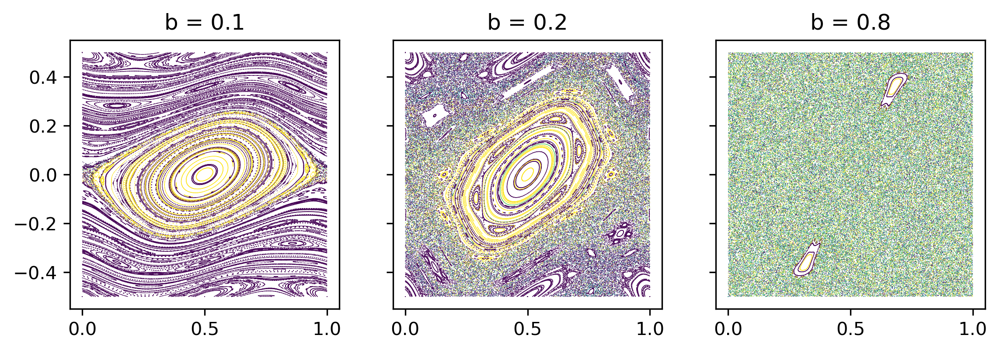

In [82]:
# %% Plot a basic Poincare section
n_particles = 256
n_steps = 512

# Plastic constant for quasirandom initial conditions; see https://extremelearning.com.au/unreasonable-effectiveness-of-quasirandom-sequences/
g = 1.32471795724474602596
a1 = 1.0/g
a2 = 1.0/(g*g)
x0 = (0.5+a1*jnp.arange(n_particles)) % 1 
y0 = (0.5+a2*jnp.arange(n_particles)) % 1 

# Compute sections for different parameters
params = [(0.0, 0.1, 0.0), (0.0, 0.2, 0.0), (0.0, 0.8, 0.0)]
vals = [compute_section((x0, y0), n_steps, p) for p in params]

# Make the actual plots
fig, axs = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True, dpi=300)
for k in range(3):
    x, y = vals[k]
    dy_avg, dy_avg_half = wba(y, diff=False)
    digits = -jnp.log10(jnp.abs((dy_avg - dy_avg_half) / ((dy_avg + dy_avg_half) / 2.0)))
    axs[k].set_title(f"b = {params[k][1]:.1f}")
    sc = axs[k].scatter(x.flatten() % 1, (y.flatten()+0.5) % 1 - 0.5, s=(72.0/100.0)**2, lw=0, marker='.', c=jnp.repeat(digits[None,:], n_steps, axis=0).flatten(), vmin=-0.3, vmax=1, cmap='viridis_r')
    axs[k].set_aspect('equal')


In [15]:
# %% Plot another basic Poincare section
n_particles = 256
n_steps = 4096

# Plastic constant for quasirandom initial conditions; see https://extremelearning.com.au/unreasonable-effectiveness-of-quasirandom-sequences/
g = 1.32471795724474602596
a1 = 1.0/g
a2 = 1.0/(g*g)
x0 = (0.5+a1*jnp.arange(n_particles)) % 1 
y0 = (0.5+a2*jnp.arange(n_particles)) % 1 

# Compute sections for different parameters
params = [(0.0, 0.1, 0.0), (0.0, 0.2, 0.0), (0.0, 0.4, 0.0), (0.0, 0.8, 0.0), (0.0, 1.6, 0.0)]
vals = [compute_section((x0, y0), n_steps, p) for p in params]

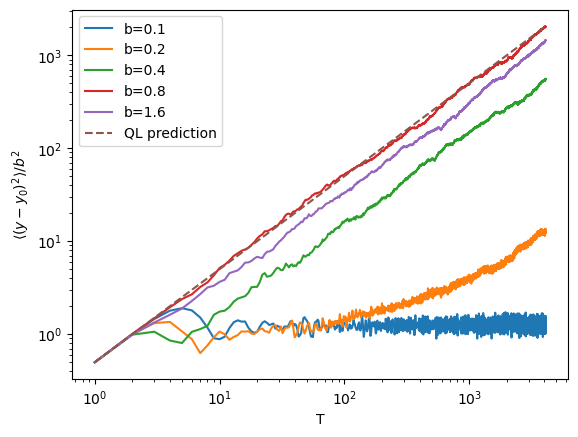

In [25]:
# %% Plot the growth of (dy)^2

plt.figure()

t = jnp.arange(n_steps)+1

ax = plt.gca()

for k in range(len(params)):
    x, y = vals[k]
    dy2 = (y - y0[None,:])**2
    ax.plot(t, dy2.mean(axis=1) / params[k][1]**2, label=f"b={params[k][1]:.1f}")

ax.plot(t, 0.5*t, label='QL prediction', ls='--')
ax.set_xscale('log')
ax.set_yscale('log')



plt.xlabel('T')
plt.ylabel(r'$\langle (y - y_0)^2 \rangle / b^2$')

plt.legend()

In [42]:
# %% Diffusion versus parameters
n_particles = 256
n_steps = 512

# Plastic constant for quasirandom initial conditions; see https://extremelearning.com.au/unreasonable-effectiveness-of-quasirandom-sequences/
g = 1.32471795724474602596
a1 = 1.0/g
a2 = 1.0/(g*g)
x0 = (0.5+a1*jnp.arange(n_particles)) % 1 
y0 = (0.5+a2*jnp.arange(n_particles)) % 1 

b = jnp.linspace(0, 20.0, 256)

dw = np.random.normal(loc=0.0, scale=np.sqrt(1e-4), size=(n_steps))

# Compute sections for different parameters
params = [(0.0, b[k], 0.0) for k in range(len(b))]
diffusions = [compute_diffusion((x0, y0), n_steps, p, dw) for p in tqdm(params)]

  0%|          | 0/256 [00:00<?, ?it/s]

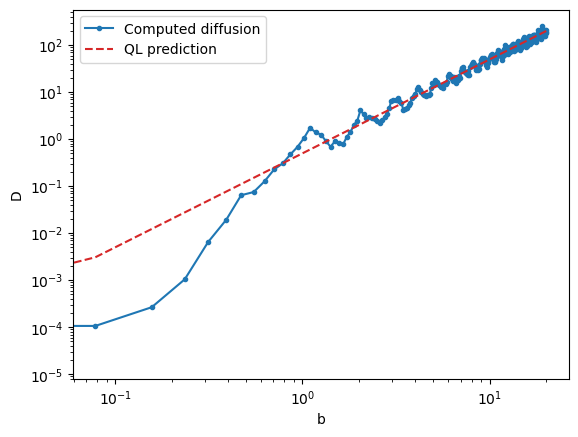

In [43]:
# %% Plot diffusions 
plt.figure()
plt.plot(b, jnp.array(diffusions), label='Computed diffusion', marker='.')
plt.xscale('log')
plt.yscale('log')
plt.plot(b, 0.5*b**2, label='QL prediction', ls='--', c='tab:red')

plt.xlabel('b')
plt.ylabel('D')
plt.legend()

## Nontwist Map

In [ ]:
# %% Diffusion versus parameters
n_particles = 256
n_steps = 4096

# Plastic constant for quasirandom initial conditions; see https://extremelearning.com.au/unreasonable-effectiveness-of-quasirandom-sequences/
g = 1.32471795724474602596
a1 = 1.0/g
a2 = 1.0/(g*g)
x0 = (0.5+a1*jnp.arange(n_particles)) % 1 
y0 = (0.5+a2*jnp.arange(n_particles)) % 1 

b = jnp.geomspace(1e-3, 10.0, 128)

# Compute sections for different parameters
params = [(-1.0, b[k], (1.0+jnp.sqrt(5))/2) for k in range(len(b))]
diffusions0 = [compute_diffusion((x0, y0), n_steps, p) for p in tqdm(params)]
params = [(1.0, b[k], (1.0+jnp.sqrt(5))/2) for k in range(len(b))]
diffusions1 = [compute_diffusion((x0, y0), n_steps, p) for p in tqdm(params)]
params = [(-1.0, b[k], 0.0) for k in range(len(b))]
diffusions2 = [compute_diffusion((x0, y0), n_steps, p) for p in tqdm(params)]
params = [(1.0, b[k], 0.0) for k in range(len(b))]
diffusions3 = [compute_diffusion((x0, y0), n_steps, p) for p in tqdm(params)]
params = [(0.0, b[k], 0.0) for k in range(len(b))]
diffusions4 = [compute_diffusion((x0, y0), n_steps, p) for p in tqdm(params)]

  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

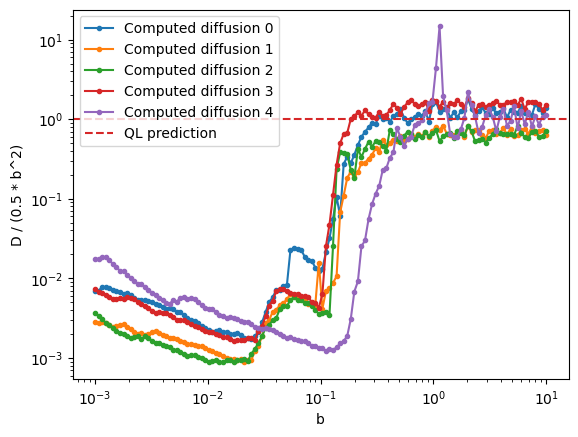

In [38]:
# %% Plot diffusions 
plt.figure()
plt.plot(b, jnp.array(diffusions0)/(0.5*b**2), label='Computed diffusion 0', marker='.')
plt.plot(b, jnp.array(diffusions1)/(0.5*b**2), label='Computed diffusion 1', marker='.')
plt.plot(b, jnp.array(diffusions2)/(0.5*b**2), label='Computed diffusion 2', marker='.')
plt.plot(b, jnp.array(diffusions3)/(0.5*b**2), label='Computed diffusion 3', marker='.')
plt.plot(b, jnp.array(diffusions4)/(0.5*b**2), label='Computed diffusion 4', marker='.')
plt.xscale('log')
plt.yscale('log')
plt.axhline(1.0, label='QL prediction', ls='--', c='tab:red')

plt.xlabel('b')
plt.ylabel('D / (0.5 * b^2)')
plt.legend()

In [4]:
n_particles = 128


a_vals = jnp.linspace(-0.5, 0.5, 48)
b_vals = jnp.linspace(0, 4.0, 128)
c_vals = jnp.array([0.0, (1.0+jnp.sqrt(5))/2, 0.5, (1.0-jnp.sqrt(5))/2])

g = 1.32471795724474602596
a1 = 1.0/g
a2 = 1.0/(g*g)
x0 = (0.5+a1*jnp.arange(n_particles)) % 1 
y0 = (0.5+a2*jnp.arange(n_particles)) % 1 

abc_grid = jnp.array(jnp.meshgrid(a_vals, b_vals, c_vals, indexing='ij'))
abc_vals = jnp.reshape(abc_grid.T, (-1, 3))

dw = jnp.array(np.random.normal(loc=0.0, scale=np.sqrt(1e-4), size=(256)))
transport_vals = jax.lax.map(lambda p: compute_diffusion((x0, y0), 256, p, dw), abc_vals, batch_size=32)
tgrid = transport_vals.reshape((len(c_vals), len(b_vals), len(a_vals))).T

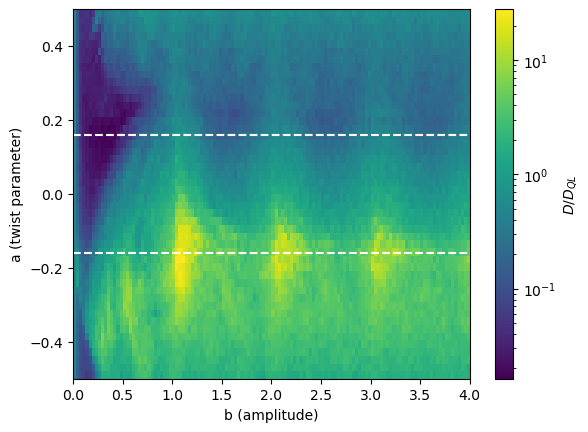

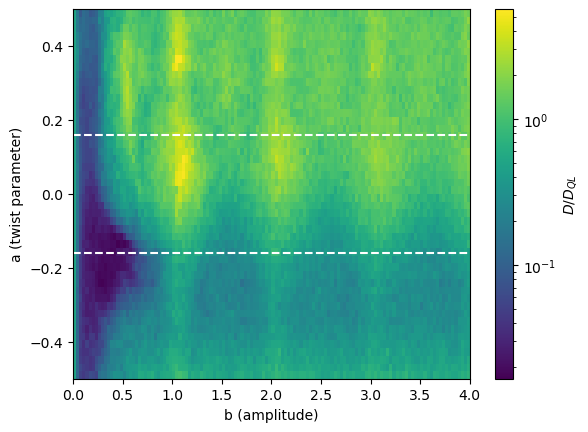

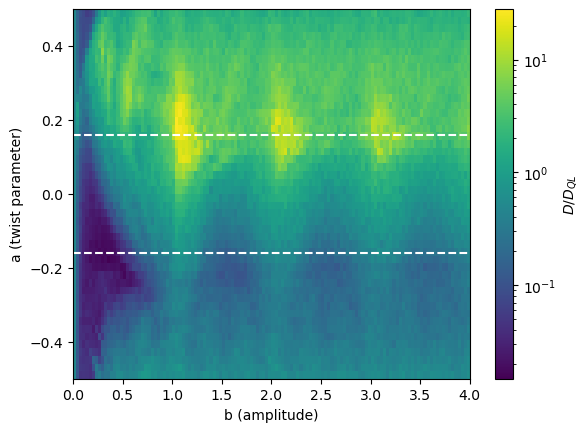

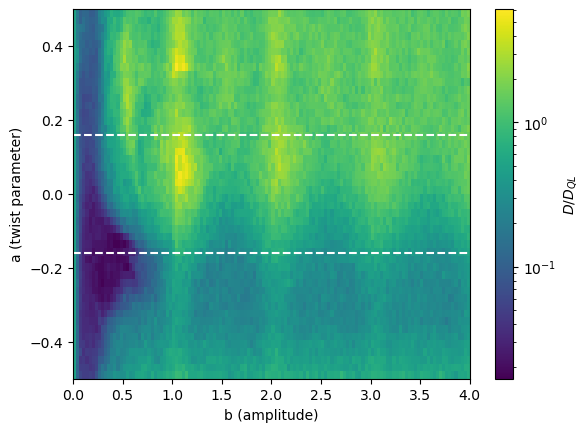

In [6]:

for k in range(4):
    plt.figure()
    to_plot = tgrid[:,:,k] / (0.5 * b_vals[None,:]**2 + 1e-4)
    plt.imshow(to_plot, origin='lower', extent=(np.min(b_vals),np.max(b_vals),-0.5,0.5), aspect='auto', norm='log')
    plt.xlabel('b (amplitude)')
    plt.ylabel('a (twist parameter)')
    #plt.contourf(b_vals, a_vals, to_plot, levels=np.geomspace(1e-2, 1e2, num=12), norm='log')
    plt.colorbar(label='$D / D_{QL}$')
    plt.axhline(1/ (2*np.pi), color='w', linestyle='--')
    plt.axhline(-1/ (2*np.pi), color='w', linestyle='--')
    



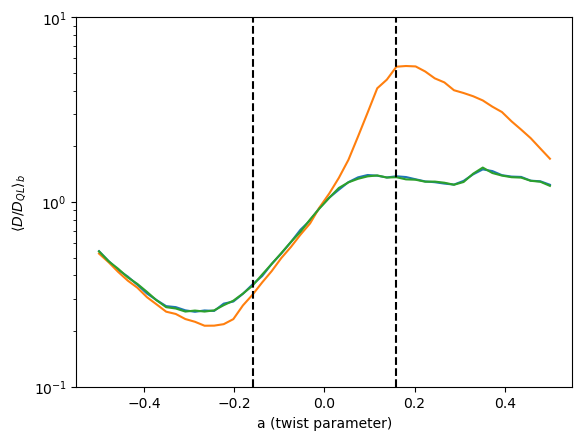

In [8]:
plt.figure()
tgrid_avg = (tgrid / (0.5 * b_vals[None,:,None]**2 + 1e-4) ).mean(axis=1)

for k in range(1,4):
    plt.plot(a_vals, tgrid_avg[:,k], label=f"c={c_vals[k]:.2f}")
plt.yscale('log')

plt.ylim(1e-1, 1e1)
plt.xlabel('a (twist parameter)')
plt.ylabel(r'$\langle D / D_{QL} \rangle_b$')

plt.axvline(1/ (2*np.pi), color='k', linestyle='--')
plt.axvline(-1/ (2*np.pi), color='k', linestyle='--')

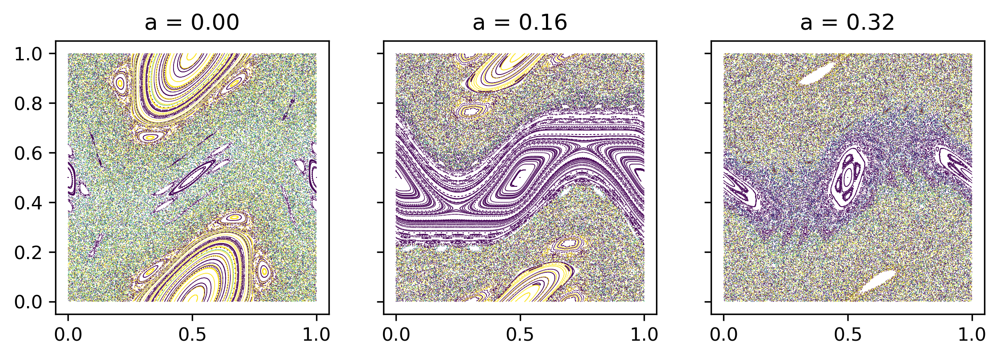

In [95]:
# %% Plot a basic Poincare section
n_particles = 256
n_steps = 512

# Plastic constant for quasirandom initial conditions; see https://extremelearning.com.au/unreasonable-effectiveness-of-quasirandom-sequences/
g = 1.32471795724474602596
a1 = 1.0/g
a2 = 1.0/(g*g)
x0 = (0.5+a1*jnp.arange(n_particles)) % 1 
y0 = (0.5+a2*jnp.arange(n_particles)) % 1 

# Compute sections for different parameters
params = [(0.0, 0.25, 0.0), (1.0/(2*jnp.pi), 0.25, 0.0), (2.0/(2*jnp.pi), 0.25, 0.0)]
vals = [compute_section((x0, y0), n_steps, p) for p in params]

# Make the actual plots
fig, axs = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True, dpi=300)
for k in range(3):
    x, y = vals[k]
    dy_avg, dy_avg_half = wba(y, diff=False)
    digits = -jnp.log10(jnp.abs((dy_avg - dy_avg_half) / ((dy_avg + dy_avg_half) / 2.0)))
    axs[k].set_title(f"a = {params[k][0]:.2f}")
    sc = axs[k].scatter(x.flatten() % 1, (y.flatten()) % 1, s=(72.0/100.0)**2, lw=0, marker='.', c=jnp.repeat(digits[None,:], n_steps, axis=0).flatten(), vmin=-0.3, vmax=1, cmap='viridis_r')
    axs[k].set_aspect('equal')


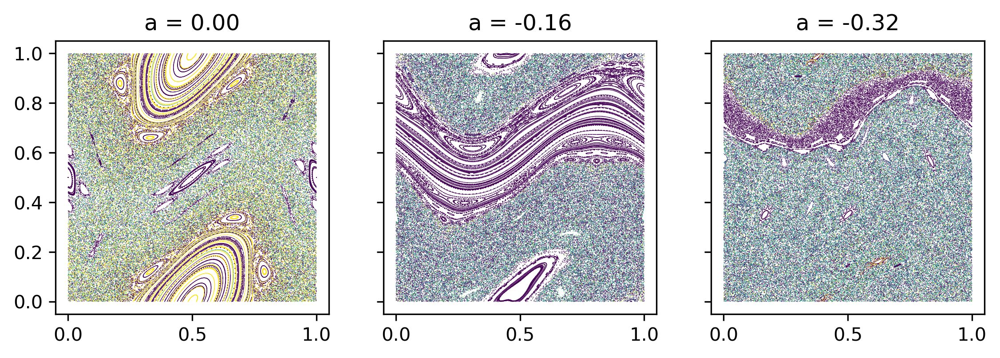

In [96]:
# %% Plot a basic Poincare section
n_particles = 256
n_steps = 512

# Plastic constant for quasirandom initial conditions; see https://extremelearning.com.au/unreasonable-effectiveness-of-quasirandom-sequences/
g = 1.32471795724474602596
a1 = 1.0/g
a2 = 1.0/(g*g)
x0 = (0.5+a1*jnp.arange(n_particles)) % 1 
y0 = (0.5+a2*jnp.arange(n_particles)) % 1 

# Compute sections for different parameters
params = [(0.0, 0.25, (1.0+jnp.sqrt(5))/2), (-1.0/(2*jnp.pi), 0.25, (1.0+jnp.sqrt(5))/2), (-2.0/(2*jnp.pi), 0.25, (1.0+jnp.sqrt(5))/2)]
vals = [compute_section((x0, y0), n_steps, p) for p in params]

# Make the actual plots
fig, axs = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True, dpi=300)
for k in range(3):
    x, y = vals[k]
    dy_avg, dy_avg_half = wba(y, diff=False)
    digits = -jnp.log10(jnp.abs((dy_avg - dy_avg_half) / ((dy_avg + dy_avg_half) / 2.0)))
    axs[k].set_title(f"a = {params[k][0]:.2f}")
    sc = axs[k].scatter(x.flatten() % 1, (y.flatten()) % 1, s=(72.0/100.0)**2, lw=0, marker='.', c=jnp.repeat(digits[None,:], n_steps, axis=0).flatten(), vmin=-0.3, vmax=1, cmap='viridis_r')
    axs[k].set_aspect('equal')


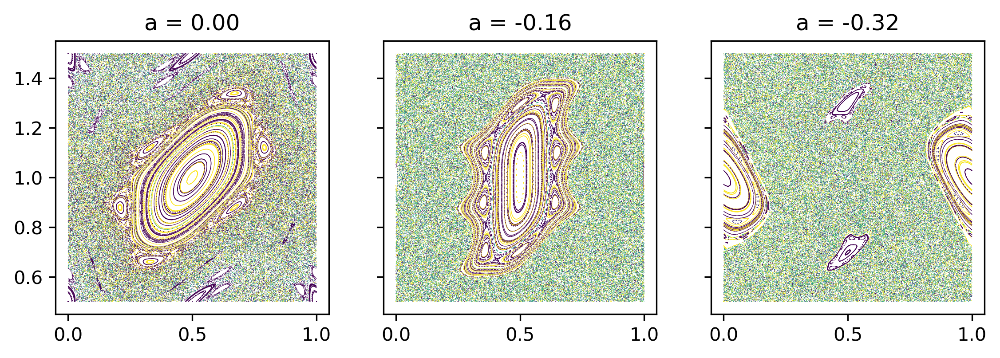

In [97]:
# %% Plot a basic Poincare section
n_particles = 256
n_steps = 512

# Plastic constant for quasirandom initial conditions; see https://extremelearning.com.au/unreasonable-effectiveness-of-quasirandom-sequences/
g = 1.32471795724474602596
a1 = 1.0/g
a2 = 1.0/(g*g)
x0 = (0.5+a1*jnp.arange(n_particles)) % 1 
y0 = (0.5+a2*jnp.arange(n_particles)) % 1 

# Compute sections for different parameters
params = [(0.0, 0.25, 0.0), (-1.0/(2*jnp.pi), 0.25, 0.0), (-2.0/(2*jnp.pi), 0.25, 0.0)]
vals = [compute_section((x0, y0), n_steps, p) for p in params]

# Make the actual plots
fig, axs = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True, dpi=300)
for k in range(3):
    x, y = vals[k]
    dy_avg, dy_avg_half = wba(y, diff=False)
    digits = -jnp.log10(jnp.abs((dy_avg - dy_avg_half) / ((dy_avg + dy_avg_half) / 2.0)))
    axs[k].set_title(f"a = {params[k][0]:.2f}")
    sc = axs[k].scatter(x.flatten() % 1, (y.flatten()-0.5) % 1 + 0.5, s=(72.0/100.0)**2, lw=0, marker='.', c=jnp.repeat(digits[None,:], n_steps, axis=0).flatten(), vmin=-0.3, vmax=1, cmap='viridis_r')
    axs[k].set_aspect('equal')


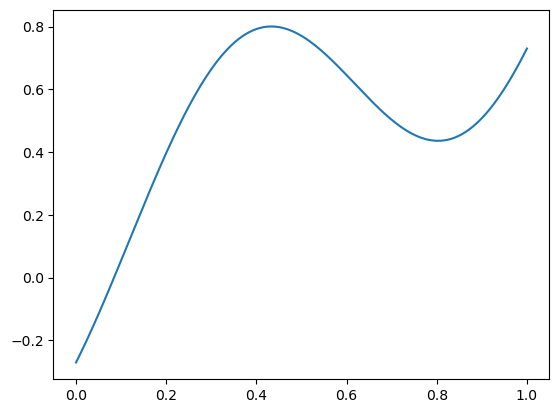

In [106]:
plt.figure()
yplot = jnp.linspace(0,1,256)
a = -0.4
c = (1.0+jnp.sqrt(5))/2
plt.plot(yplot, yplot + a * jnp.sin(2 * jnp.pi * (yplot - c)))

In [25]:
tgrid.shape

(16, 24, 2)

In [ ]:

for j in range(len(a_vals)):
    map_params = jax.tree_util.Partial(map, params=(a_vals[j], 0.3))

    n_particles = 256
    x0 = jnp.linspace(0,1,n_particles)
    y0 = jnp.linspace(0,1,n_particles)

    vals = jax.lax.scan(map_params, (x0, y0), None, length=1024)
    xy_map = jnp.array(vals[1])
    y_max.append(jnp.std(xy_map[1,:,:]))

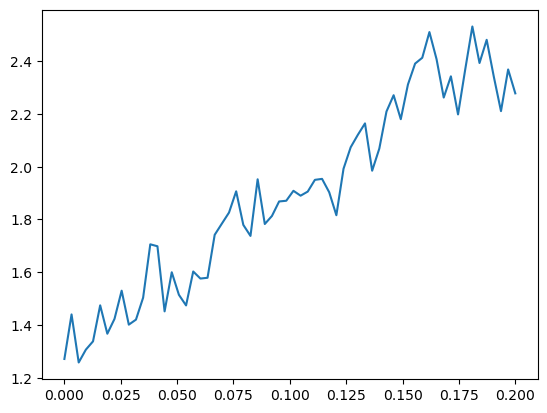

In [197]:
plt.figure()
plt.plot(a_vals, y_max)

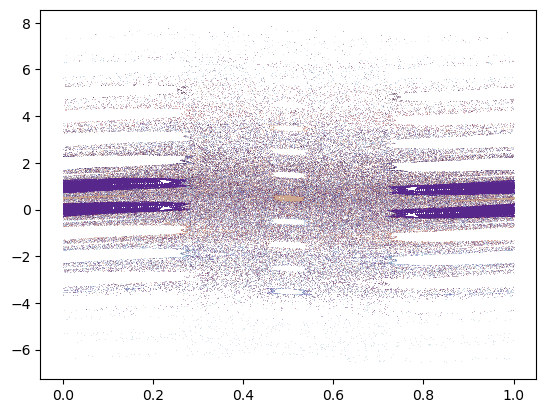

In [170]:
xy_map = jnp.array(vals[1])

rotation_number = jnp.sum(weight[:-1,None] * jnp.diff(xy_map[0,:,:], axis=0), axis=0) / jnp.sum(weight[:-1])
y_avg = jnp.sum(weight[:-1,None] * xy_map[1,:-1,:], axis=0) / jnp.sum(weight[:-1])

plt.figure()
#plt.axis('square')
#plt.xlim(0,1)
#plt.ylim(0,1)
for k in range(n_particles):
    plt.scatter(jnp.mod(xy_map[0,:,k], 1), xy_map[1,:,k], s=(72.0/100.0)**2, marker='.', lw=0, color=mpl.cm.twilight((rotation_number[k] - (1 + jnp.sqrt(5)) / 2) % 1))

(array([  819.,  1395.,  1813.,  2304.,  2609.,  2874.,  3125.,  4260.,
         5047.,  8396., 11863.,  8020.,  7901.,  8327.,  8014.,  8303.,
         9277., 10174.,  7189.,  6293.,  5950.,  7392.,  6338.,  7118.,
         6134.,  5574.,  5205.,  4991.,  4865.,  4897.,  4409.,  3808.,
         3633.,  3815.,  3825.,  3956.,  4986.,  6490.,  4610.,  3320.,
         3561.,  3529.,  3402.,  3122.,  3729.,  4424.,  3487.,  2358.,
         2075.,  1772.,  1778.,  1651.,  1669.,  1289.,  1117.,   843.,
          781.,   577.,   454.,   403.,   392.,   248.,    83.,    81.]),
 array([-0.36224645, -0.32626372, -0.29028098, -0.25429824, -0.21831551,
        -0.18233277, -0.14635004, -0.1103673 , -0.07438457, -0.03840183,
        -0.00241909,  0.03356364,  0.06954638,  0.10552911,  0.14151185,
         0.17749459,  0.21347732,  0.24946006,  0.28544279,  0.32142553,
         0.35740827,  0.393391  ,  0.42937374,  0.46535647,  0.50133921,
         0.53732195,  0.57330468,  0.60928742,  0.6452701

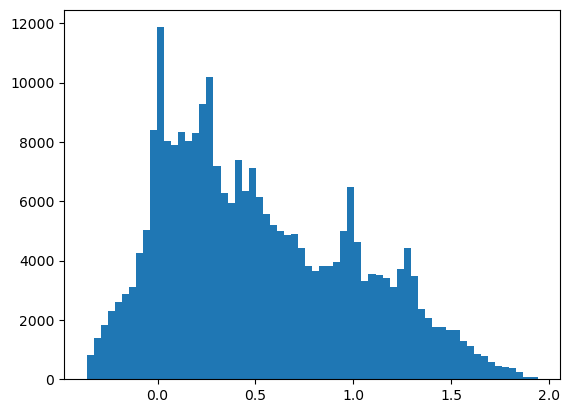

In [155]:
plt.figure()
plt.hist(jnp.ravel(xy_map[1,:,:]), bins=64)

In [ ]:
s = jnp.linspace(0, 1, xy_map.shape[1])

weight = jnp.exp(-1.0 / (s * (1.0 - s)))




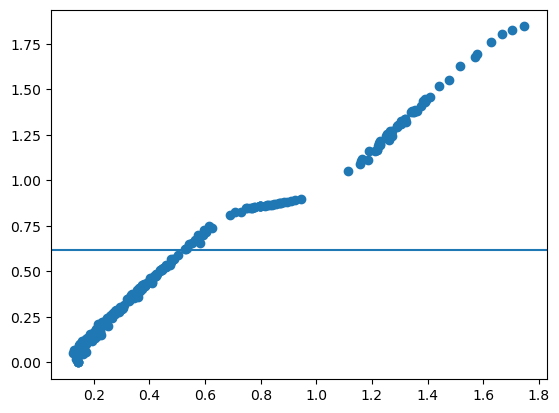

In [150]:
plt.figure()
plt.scatter(y_avg, rotation_number)
plt.axhline((1 + np.sqrt(5)) / 2 - 1)

In [120]:
(1 - np.sqrt(5))/2

np.float64(-0.6180339887498949)